# HR Diagram

Here, I will try to process all 4 filter of M55 in parallel. I will detect the star in B filter and apply the location 

I've visually checked through pixinsight, the images are aligned. 

Remember to check the *file name* info and *reference star* info before executing the notebook!

In [1]:
# Library
from astropy.io import fits
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from mpl_toolkits.mplot3d import Axes3D #for display interactive 3D plot

import sep

from astropy.coordinates import SkyCoord
from astropy import units as u
from astropy.wcs import WCS
from astroquery.gaia import Gaia

"Important:  Gaia archive will be intermittently unavailable due to scheduled maintenance on 10-12-2024 from 08:00 to 10:00 (CET)"


## Import Data

### !!! Below is the absolute file path on my computer, you DEFINITELY need to REPLACE THIS. A simple way to do it is to open terminal and drag & drop the file in to the terminal, then you'll be able to copy and past the absolute file path from there

In [2]:
# Specify the path to your FITS file
B = '/Users/huanghaiyun/Desktop/134L/lco_data-20241030-14/lsc0m492-sq35-20241029-0101-e91.fits'
V = '/Users/huanghaiyun/Desktop/134L/lco_data-20241030-14/lsc0m492-sq35-20241029-0106-e91.fits'
r = '/Users/huanghaiyun/Desktop/134L/lco_data-20241030-14/lsc0m492-sq35-20241029-0111-e91.fits'
i = '/Users/huanghaiyun/Desktop/134L/lco_data-20241030-14/lsc0m492-sq35-20241029-0113-e91.fits'

with fits.open(B) as hdul:
    # Print a summary of the file
    #hdul.info()
    # Access the primary header data unit (HDU)
    B_primary_hdu = hdul[0]
    B_sci = hdul[0].data        # SCI, primary HDU
    #cat = hdul[1].data              # CAT
    #bpm_image = hdul[2].data        # Bad Pixel Map
    #err_image = hdul[3].data        # Error
    B_header = B_primary_hdu.header
    #print(header)  # Print the header information

with fits.open(V) as hdul:
    # Print a summary of the file
    #hdul.info()
    # Access the primary header data unit (HDU)
    V_primary_hdu = hdul[0]
    V_sci = hdul[0].data        # SCI, primary HDU
    #cat = hdul[1].data              # CAT
    #bpm_image = hdul[2].data        # Bad Pixel Map
    #err_image = hdul[3].data        # Error
    V_header = V_primary_hdu.header
    #print(header)  # Print the header information

with fits.open(r) as hdul:
    # Print a summary of the file
    #hdul.info()
    # Access the primary header data unit (HDU)
    r_primary_hdu = hdul[0]
    r_sci = hdul[0].data        # SCI, primary HDU
    #cat = hdul[1].data              # CAT
    #bpm_image = hdul[2].data        # Bad Pixel Map
    #err_image = hdul[3].data        # Error
    r_header = r_primary_hdu.header
    #print(header)  # Print the header information

with fits.open(i) as hdul:
    # Print a summary of the file
    #hdul.info()
    # Access the primary header data unit (HDU)
    i_primary_hdu = hdul[0]
    i_sci = hdul[0].data        # SCI, primary HDU
    #cat = hdul[1].data              # CAT
    #bpm_image = hdul[2].data        # Bad Pixel Map
    #err_image = hdul[3].data        # Error
    i_header = i_primary_hdu.header
    #print(header)  # Print the header information

In [3]:
# Double check imported data by checking filter and exposure time in the header
print("B filter: {}, Time: {}s".format(B_header['FILTER'], B_header['EXPTIME']))
print("V filter: {}, Time: {}s".format(V_header['FILTER'], V_header['EXPTIME']))
print("rp filter: {}, Time: {}s".format(r_header['FILTER'], r_header['EXPTIME']))
print("ip filter: {}, Time: {}s".format(i_header['FILTER'], i_header['EXPTIME']))


B filter: B, Time: 60.0s
V filter: V, Time: 60.0s
rp filter: rp, Time: 60.0s
ip filter: ip, Time: 60.0s


## Functions
Define a few function for better visualization and checking result

In [4]:
# Linear Fit
def linear_stretch(image, lower_percentile=2, upper_percentile=98):
    # Get the lower and upper bounds for stretching
    lower_bound = np.percentile(image, lower_percentile)
    upper_bound = np.percentile(image, upper_percentile)
    
    # Apply linear stretching
    stretched = np.clip((image - lower_bound) / (upper_bound - lower_bound), 0, 1)
    return stretched

In [5]:
# visual_detect (visualization of detected stars)
def visual_detect(sci_image, x, y, size = 10, x_win = (0,0), y_win = (0,0,), stretch = True, heatmap = False, fail_match_x = [], fail_match_y = [], fail_match_r = []):
    if x_win == (0,0):
        x_win = (0, len(sci_image[0]))
    if y_win == (0,0):
        y_win = (0, len(sci_image))
    if stretch:
        linear_stretched_image = linear_stretch(sci_image[y_win[0]:y_win[1]+1, x_win[0]:x_win[1]+1])
    else:
        linear_stretched_image = np.copy(sci_image[y_win[0]:y_win[1]+1, x_win[0]:x_win[1]+1])

    # Set up the plot to display images side by side
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Display the original SCI image with a circle around the selected star
    if heatmap:
        c0 = axes[0].imshow(linear_stretched_image, cmap='RdBu')
        fig.colorbar(c0, ax=axes[0])
    else:
        axes[0].imshow(linear_stretched_image, cmap='gray')
    axes[0].set_title('Star Detection')
    axes[0].axis('off')

    # Draw a circle around the selected star
    # check if size is a int or a list
    if isinstance(size, int):
        # draw matched stars
        for i in range(len(x)):
            circle = plt.Circle((x[i]-x_win[0], y[i]-y_win[0]), size, color='red', fill=False, linewidth=0.4)
            axes[0].add_patch(circle)
        # draw failed matches if there is any, by default this is empty, so no drawing
        for i in range(len(fail_match_x)):
            circle = plt.Circle((fail_match_x[i]-x_win[0], fail_match_y[i]-y_win[0]), fail_match_r[i], color='blue', fill=False, linewidth=0.4)
            axes[0].add_patch(circle)
    else:
        # draw matched stars
        for i in range(len(x)):
            circle = plt.Circle((x[i]-x_win[0], y[i]-y_win[0]), size[i], color='red', fill=False, linewidth=0.4)
            axes[0].add_patch(circle)
        # draw failed matches if there is any, by default this is empty, so no drawing
        for i in range(len(fail_match_x)):
            circle = plt.Circle((fail_match_x[i]-x_win[0], fail_match_y[i]-y_win[0]), fail_match_r[i], color='blue', fill=False, linewidth=0.4)
            axes[0].add_patch(circle)

    # Display the linearly stretched image
    if heatmap:
        c1 = axes[1].imshow(linear_stretched_image, cmap='RdBu')
        fig.colorbar(c1, ax=axes[1])
    else:
        axes[1].imshow(linear_stretched_image, cmap='gray')
    axes[1].set_title('Image')
    axes[1].axis('off')

    # Show the plot
    plt.tight_layout()
    plt.show()

In [6]:
# visual_star (visualize individual star in 3D)
def visual_star(sci_image, x, y, size, star_number = 0, stretch = False):
    #start interactive window
    %matplotlib widget

    center = (x[star_number], y[star_number])
    row, col = sci_image.shape
    
    # Define a sub-region in the image
    x_min = max(0, int(center[0] - 2*size[star_number]))
    x_max = min(row-1, int(center[0] + 2*size[star_number]))
    y_min = max(0, int(center[1] - 2*size[star_number]))
    y_max = min(col-1, int(center[1] + 2*size[star_number]))
    
    if stretch:
        image = linear_stretch(sci_image[y_min:y_max+1, x_min:x_max+1])
    else:
        image = np.copy(sci_image[y_min:y_max+1, x_min:x_max+1])


    # Create the figure and subplots
    fig = plt.figure(figsize=(12, 6))

    # Static image subplot
    ax1 = fig.add_subplot(1, 2, 1)  # 1 row, 2 columns, 1st subplot
    ax1.imshow(image, cmap='gray')  # Display static image
    ax1.set_title('The Star in Image')
    ax1.set_xlabel('X-axis')
    ax1.set_ylabel('Y-axis')

    # Plot the circle
    circle = plt.Circle((x[star_number]-x_min, y[star_number]-y_min), size[star_number], color='red', fill=False, linewidth=0.4)
    ax1.add_patch(circle)

    # Generate x, y coordinates for 3D plot
    rows, cols = image.shape
    x_ = np.linspace(0, cols - 1, cols)
    y_ = np.linspace(0, rows - 1, rows)
    x_, y_ = np.meshgrid(x_, y_)

    # 3D plot subplot
    ax2 = fig.add_subplot(1, 2, 2, projection='3d')  # 1 row, 2 columns, 2nd subplot
    ax2.plot_surface(x_, y_, image, cmap='viridis', edgecolor='none')  # 3D surface plot
    ax2.set_title('3D Plot of the Star')
    ax2.set_xlabel('X-axis')
    ax2.set_ylabel('Y-axis')
    ax2.set_zlabel('Luminance')

    # Plot the circle in 3D
    ## Create a meshgrid for the cylinder
    height = np.mean(image) * 4
    z_c = np.linspace(0, height, 100)
    theta = np.linspace(0, 2 * np.pi, 100)
    theta, z_c = np.meshgrid(theta, z_c)
    ## Parametric equations for the cylinder
    x_c = center[0]-x_min + size[star_number] * np.cos(theta)
    y_c = center[1]-y_min + size[star_number] * np.sin(theta)
    ## Plot the cylinder surface
    ax2.plot_surface(x_c, y_c, z_c, cmap = "RdBu", alpha=1, edgecolor='none')

    # Show the plot
    plt.tight_layout()
    plt.show()
    

In [7]:
# slightly modify the mask
def aperture_mask(outer): # radius of inner and outer annulus
    outer = int(outer)
    frame = np.zeros([2*outer+1, 2*outer+1])
    center = outer
    
    for x in range(2*outer+1):
        for y in range(2*outer+1):
            if (x-outer)**2 + (y-outer)**2 <= (outer+0.5)**2:
                frame[x][y] = 1
    return frame, np.sum(frame), center

In [8]:
#customize input here
def remove_detected_star(sci, x_detect, y_detect, r_detect, bkg, offset):
    remove_detect = np.copy(sci)

    image_xlim = len(sci[0]) #2400
    image_ylim = len(sci)

    for ind in range(len(x_detect)):
        x, y, r = x_detect[ind], y_detect[ind], r_detect[ind]
        aperture, pix_count, center = aperture_mask(r+offset)
        for i in range(len(aperture)): #y
            for j in range(len(aperture[0])): #x
                if aperture[i][j] == 1:
                    x_pos = int(x - r + j)
                    y_pos = int(y - r + i)
                    if  0 <= x_pos < image_xlim and 0 <= y_pos < image_ylim:
                        remove_detect[y_pos][x_pos] = bkg[y_pos][x_pos]
    return remove_detect

In [9]:
'''
Sample Syntax:
n_image, Bn_x, Bn_y, Bn_r = iteration(B2_sci, threshold = 3, radius_cutoff = 7, show = ['detect', 'show remove'], x_win = [0, 2400], y_win = [0, 2400])
'''

def iteration(sci, threshold, radius_cutoff, offset = 0, show = ['detect', 'cutoff', 'remove', 'show remove'], x_win = [0, 2400], y_win = [0, 2400]): 
# show = ['detect', 'cutoff', 'remove']
# 'detect': show star selected with given threshold
# 'cutoff': show star left after removing those with radius larger than the cutoff
# 'remove': display nothing, return the <image> with star removed and the <list> of all x and y of the removed stars.
    for cmd in show:
        if cmd not in ['detect', 'cutoff', 'remove', 'show remove']:
            print("Invalid input")
            return "Invalid input"
    sep_0 = sci.byteswap().newbyteorder()
    bkg_0 = sep.Background(sep_0, bw = 80, bh = 80)

    sub = sep_0 - bkg_0
    objects = sep.extract(sub, thresh = threshold, err=bkg_0.globalrms) 

    # get rid of bad pixel (some single pixel)
    sci_objects_filter = objects[objects['tnpix'] > 10]     #tnpix: number of pixel above threshold
    # save x y position of the star centroid
    x_, y_ = sci_objects_filter['x'], sci_objects_filter['y']
    r_ = np.rint(np.sqrt(sci_objects_filter['npix']/np.pi)) #npix: number of pixel belong to the object
    
    # display al detected stars 
    if 'detect' in show:
        visual_detect(sci, x_, y_, size=r_, x_win = x_win, y_win = y_win)

    # remove star with radius too large
    x_, y_, r_ = x_[r_<radius_cutoff], y_[r_<radius_cutoff], r_[r_<radius_cutoff]
    if 'cutoff' in show:
        visual_detect(sci, x_, y_, size=r_, x_win = x_win, y_win = y_win)
    
    new_sci = remove_detected_star(sci, x_, y_, r_, bkg_0.back(), offset=offset)
    if 'show remove' in show:
        visual_detect(new_sci, x_, y_, size=r_, x_win = x_win, y_win = y_win)

    if 'remove' in show:
        return new_sci, x_, y_, r_

## Star Detecttion
### Interation 1 (start with dim stars) (thres = 1.5, cutoff = 6)

In [10]:
B2_sci, B2_x, B2_y, B2_r = iteration(B_sci, threshold = 1.5, radius_cutoff = 6, show = ['remove'], x_win = [0, 2400], y_win = [0, 2400])
V2_sci, V2_x, V2_y, V2_r = iteration(V_sci, threshold = 1.5, radius_cutoff = 6, show = ['remove'], x_win = [0, 2400], y_win = [0, 2400])
r2_sci, r2_x, r2_y, r2_r = iteration(r_sci, threshold = 1.5, radius_cutoff = 6, show = ['remove'], x_win = [0, 2400], y_win = [0, 2400])
i2_sci, i2_x, i2_y, i2_r = iteration(i_sci, threshold = 1.5, radius_cutoff = 6, show = ['remove'], x_win = [0, 2400], y_win = [0, 2400])

### Interation 2 (medium brightness star)

In [11]:
B3_sci, B3_x, B3_y, B3_r = iteration(B2_sci, threshold = 2, radius_cutoff = 6, show = ['remove'], x_win = [0, 2400], y_win = [0, 2400])
V3_sci, V3_x, V3_y, V3_r = iteration(V2_sci, threshold = 2, radius_cutoff = 6, show = ['remove'], x_win = [0, 2400], y_win = [0, 2400])
r3_sci, r3_x, r3_y, r3_r = iteration(r2_sci, threshold = 2, radius_cutoff = 6, show = ['remove'], x_win = [0, 2400], y_win = [0, 2400])
i3_sci, i3_x, i3_y, i3_r = iteration(i2_sci, threshold = 2, radius_cutoff = 6, show = ['remove'], x_win = [0, 2400], y_win = [0, 2400])

### Interation 3

In [12]:
B4_sci, B4_x, B4_y, B4_r = iteration(B3_sci, threshold = 3, radius_cutoff = 7, show = ['remove'], x_win = [0, 2400], y_win = [0, 2400])
V4_sci, V4_x, V4_y, V4_r = iteration(V3_sci, threshold = 3, radius_cutoff = 7, show = ['remove'], x_win = [0, 2400], y_win = [0, 2400])
r4_sci, r4_x, r4_y, r4_r = iteration(r3_sci, threshold = 3, radius_cutoff = 7, show = ['remove'], x_win = [0, 2400], y_win = [0, 2400])
i4_sci, i4_x, i4_y, i4_r = iteration(i3_sci, threshold = 3, radius_cutoff = 7, show = ['remove'], x_win = [0, 2400], y_win = [0, 2400])

### Iteration 4

In [13]:
B5_sci, B5_x, B5_y, B5_r = iteration(B4_sci, threshold = 4, radius_cutoff = 9, show = ['remove'], x_win = [0, 2400], y_win = [0, 2400])
V5_sci, V5_x, V5_y, V5_r = iteration(V4_sci, threshold = 4, radius_cutoff = 9, show = ['remove'], x_win = [0, 2400], y_win = [0, 2400])
r5_sci, r5_x, r5_y, r5_r = iteration(r4_sci, threshold = 4, radius_cutoff = 9, show = ['remove'], x_win = [0, 2400], y_win = [0, 2400])
i5_sci, i5_x, i5_y, i5_r = iteration(i4_sci, threshold = 4, radius_cutoff = 9, show = ['remove'], x_win = [0, 2400], y_win = [0, 2400])

### Iteration 5

In [14]:
B6_sci, B6_x, B6_y, B6_r = iteration(B4_sci, threshold = 14, radius_cutoff = 12, offset = 1, show = ['remove'], x_win = [0, 2400], y_win = [0, 2400])
V6_sci, V6_x, V6_y, V6_r = iteration(V4_sci, threshold = 14, radius_cutoff = 12, offset = 1, show = ['remove'], x_win = [0, 2400], y_win = [0, 2400])
r6_sci, r6_x, r6_y, r6_r = iteration(r4_sci, threshold = 14, radius_cutoff = 12, offset = 1, show = ['remove'], x_win = [0, 2400], y_win = [0, 2400])
i6_sci, i6_x, i6_y, i6_r = iteration(i4_sci, threshold = 14, radius_cutoff = 12, offset = 1, show = ['remove'], x_win = [0, 2400], y_win = [0, 2400])

### Interation 6

In [15]:
B7_sci, B7_x, B7_y, B7_r = iteration(B6_sci, threshold = 16, radius_cutoff = 12, show = ['remove'], x_win = [0, 2400], y_win = [0, 2400])
V7_sci, V7_x, V7_y, V7_r = iteration(V6_sci, threshold = 16, radius_cutoff = 12, show = ['remove'], x_win = [0, 2400], y_win = [0, 2400])
r7_sci, r7_x, r7_y, r7_r = iteration(r6_sci, threshold = 16, radius_cutoff = 12, show = ['remove'], x_win = [0, 2400], y_win = [0, 2400])
i7_sci, i7_x, i7_y, i7_r = iteration(i6_sci, threshold = 16, radius_cutoff = 12, show = ['remove'], x_win = [0, 2400], y_win = [0, 2400])

In [16]:
B_x = np.concatenate((B2_x, B3_x, B4_x, B5_x, B6_x, B7_x))
B_y = np.concatenate((B2_y, B3_y, B4_y, B5_y, B6_y, B7_y))
B_radius = np.concatenate((B2_r, B3_r, B4_r, B5_r, B6_r, B7_r))

V_x = np.concatenate((V2_x, V3_x, V4_x, V5_x, V6_x, V7_x))
V_y = np.concatenate((V2_y, V3_y, V4_y, V5_y, V6_y, V7_y))
V_radius = np.concatenate((V2_r, V3_r, V4_r, V5_r, V6_r, V7_r))

r_x = np.concatenate((r2_x, r3_x, r4_x, r5_x, r6_x, r7_x))
r_y = np.concatenate((r2_y, r3_y, r4_y, r5_y, r6_y, r7_y))
r_radius = np.concatenate((r2_r, r3_r, r4_r, r5_r, r6_r, r7_r))

i_x = np.concatenate((i2_x, i3_x, i4_x, i5_x, i6_x, i7_x))
i_y = np.concatenate((i2_y, i3_y, i4_y, i5_y, i6_y, i7_y))
i_radius = np.concatenate((i2_r, i3_r, i4_r, i5_r, i6_r, i7_r))

In [17]:
'''
# Detect star in V filter
V_objects = sep.extract(V_sub, thresh = 12, err=V_bkg.globalrms)

#Threshold pixel value for detection. If an err or var array is not given, this is interpreted as an absolute threshold. 
#If err or var is given, this is interpreted as a relative threshold
print(f"Detected {len(V_objects)} sources")
#get rid of bad pixel (some single pixel)
V_objects_filter = V_objects[V_objects['tnpix'] > 10]     #tnpix: number of pixel above threshold
print(f"Detected {len(V_objects_filter)} sources")
#save x y position of the star centroid
V_x, V_y = V_objects_filter['x'], V_objects_filter['y']
V_radius = np.rint(np.sqrt(V_objects_filter['npix']/np.pi)) #npix: number of pixel belong to the object
'''

'\n# Detect star in V filter\nV_objects = sep.extract(V_sub, thresh = 12, err=V_bkg.globalrms)\n\n#Threshold pixel value for detection. If an err or var array is not given, this is interpreted as an absolute threshold. \n#If err or var is given, this is interpreted as a relative threshold\nprint(f"Detected {len(V_objects)} sources")\n#get rid of bad pixel (some single pixel)\nV_objects_filter = V_objects[V_objects[\'tnpix\'] > 10]     #tnpix: number of pixel above threshold\nprint(f"Detected {len(V_objects_filter)} sources")\n#save x y position of the star centroid\nV_x, V_y = V_objects_filter[\'x\'], V_objects_filter[\'y\']\nV_radius = np.rint(np.sqrt(V_objects_filter[\'npix\']/np.pi)) #npix: number of pixel belong to the object\n'

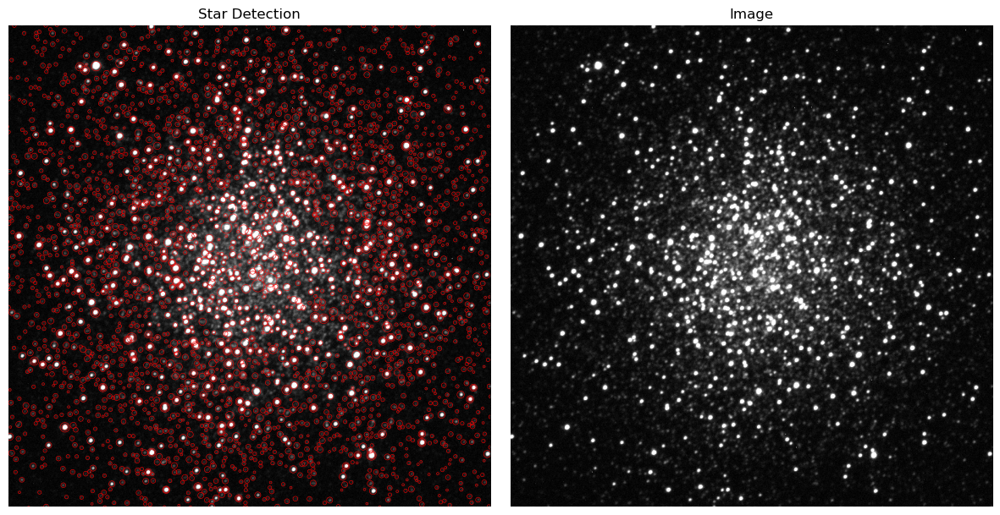

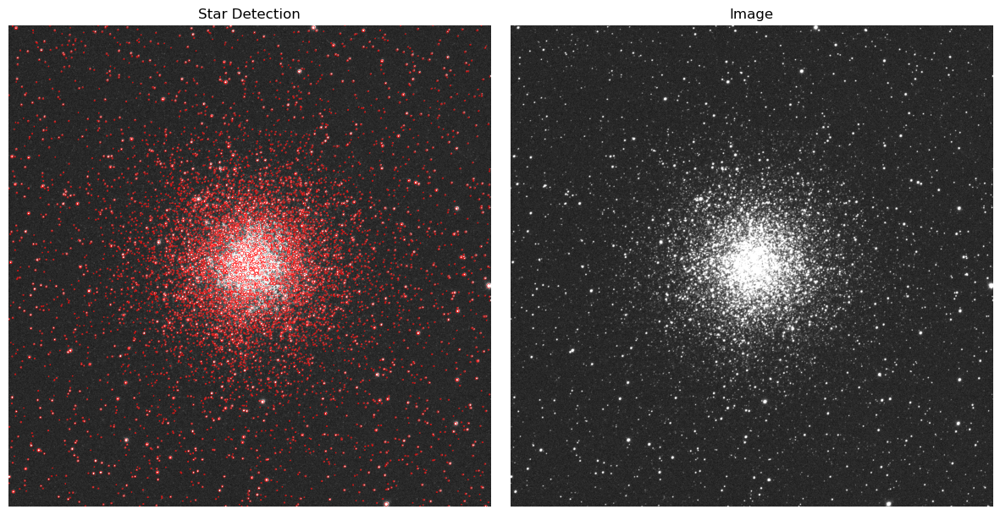

In [18]:
# visual inspect B
visual_detect(B_sci, B_x, B_y, size=B_radius, x_win=[800,1600], y_win=[800,1600])
visual_detect(B_sci, B_x, B_y, size=B_radius)

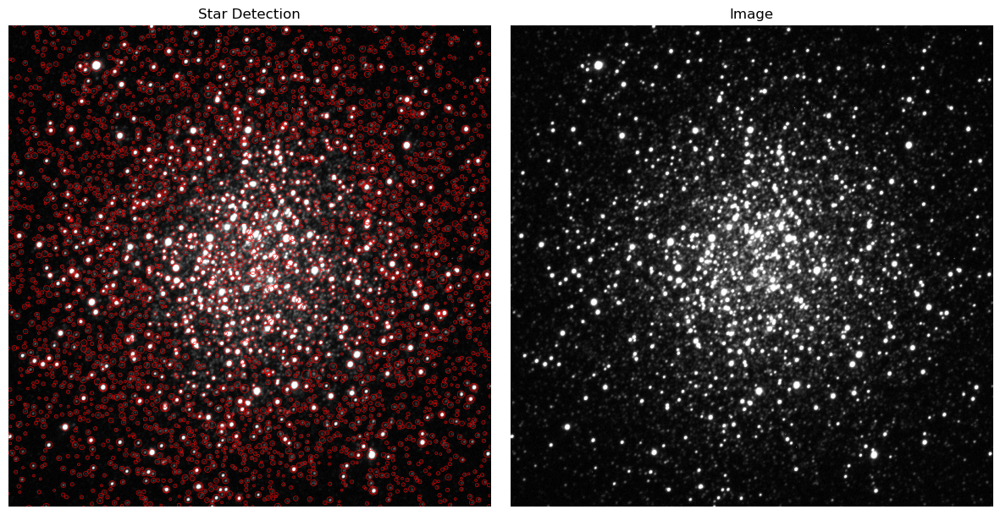

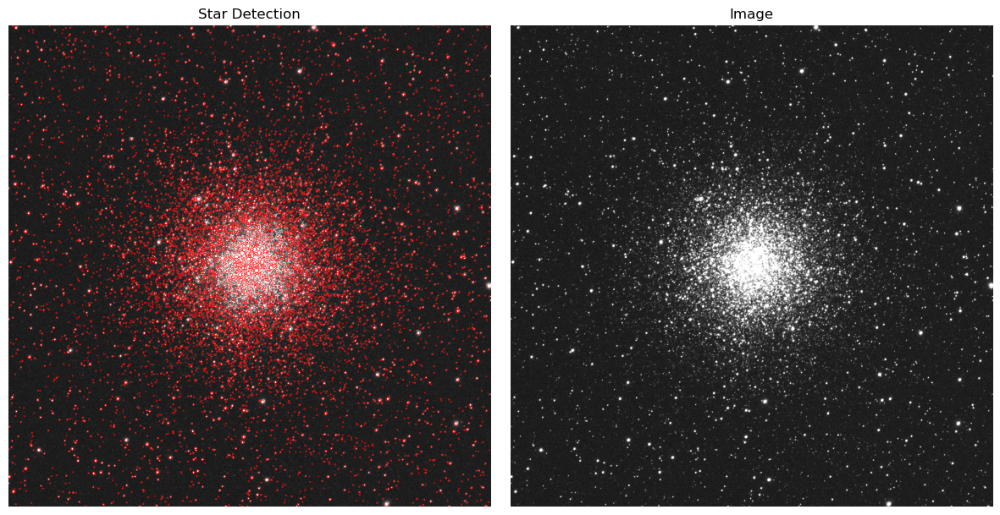

In [19]:
# visual inspect V
visual_detect(V_sci, V_x, V_y, size=V_radius, x_win=[800,1600], y_win=[800,1600])
visual_detect(V_sci, V_x, V_y, size=V_radius)

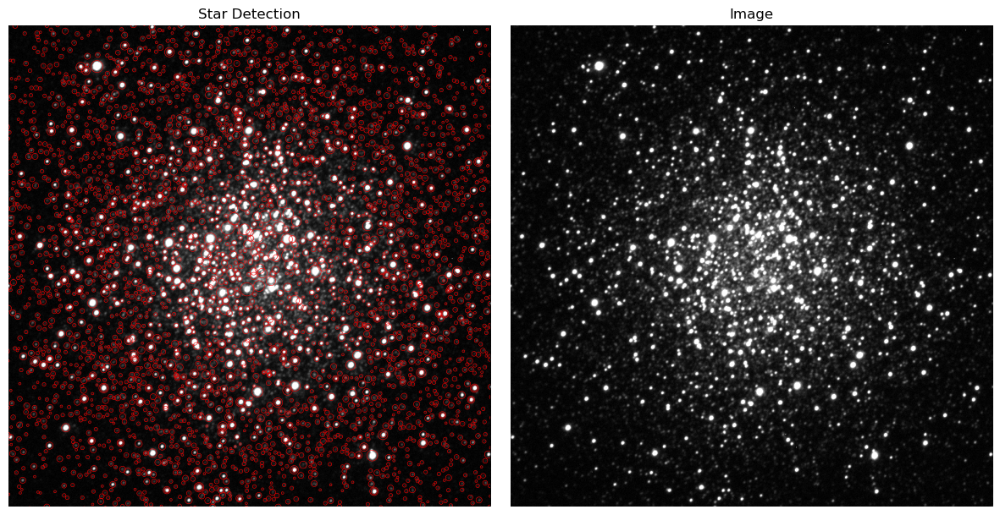

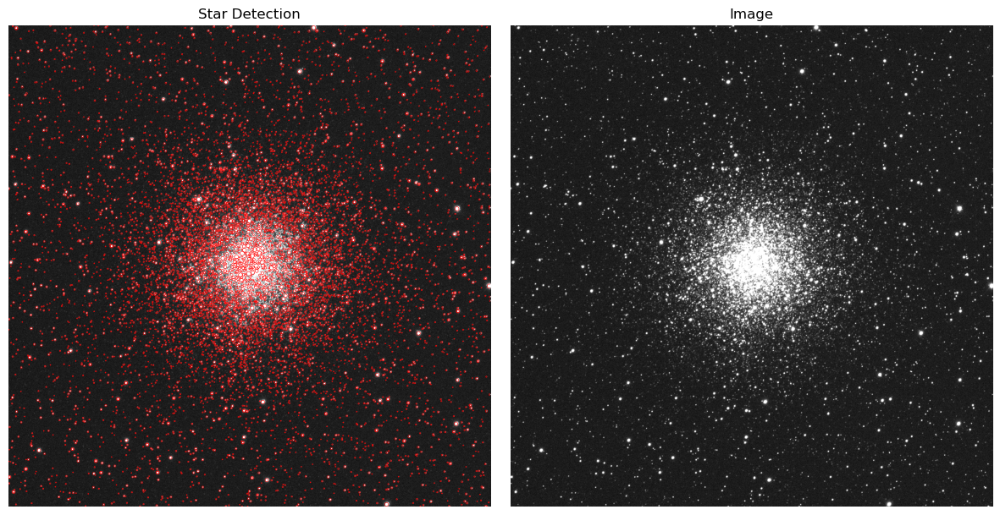

In [20]:
# visual inspect r
visual_detect(r_sci, r_x, r_y, size=r_radius, x_win=[800,1600], y_win=[800,1600])
visual_detect(r_sci, r_x, r_y, size=r_radius)

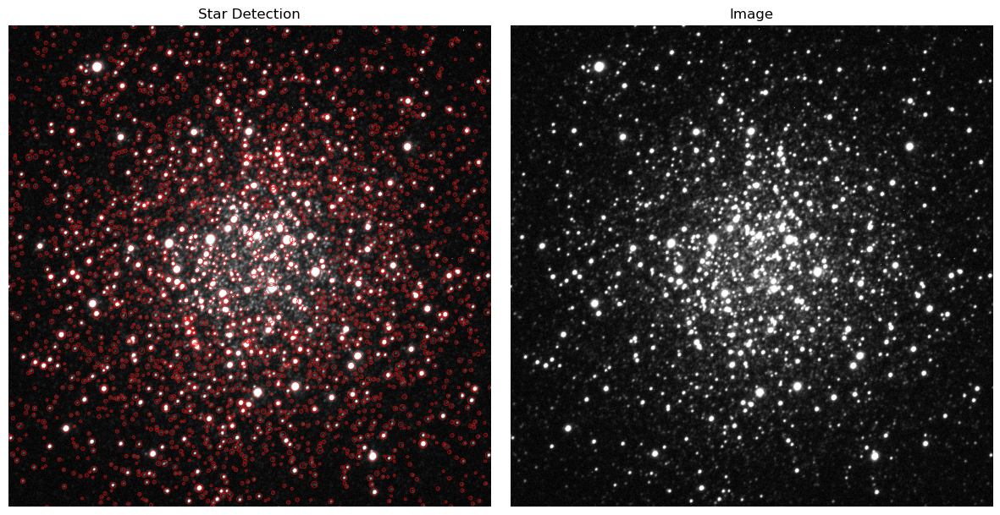

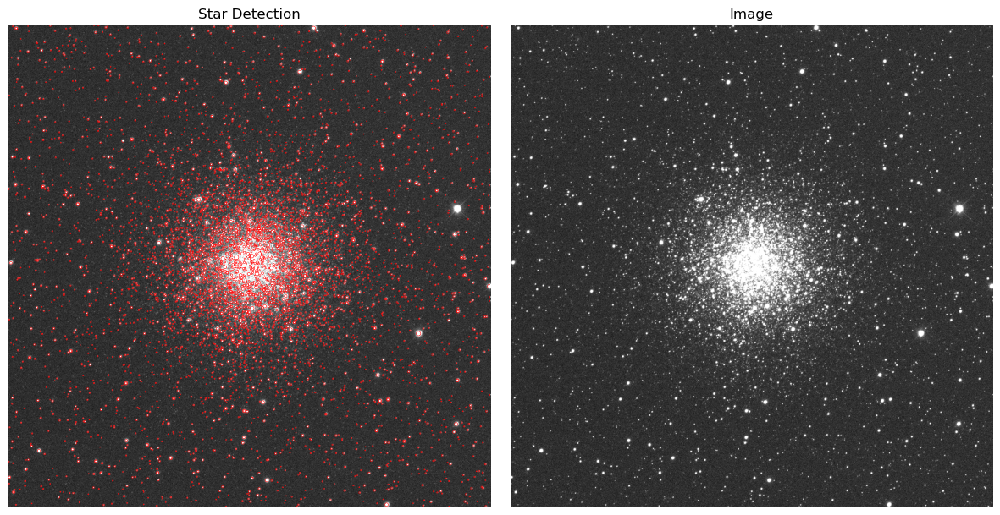

In [21]:
# visual inspect i
visual_detect(i_sci, i_x, i_y, size=i_radius, x_win=[800,1600], y_win=[800,1600])
visual_detect(i_sci, i_x, i_y, size=i_radius)

## Matching Gaia Catelog
Since the number of stars detected in each filter is different, I would match each of them to the gaia catelog, then only consider the stars that are detected in all 4 channel and found in gaia catelog. 

### !! Warning !! the next step take exceptionally long (took me 37.8s) because there are sooooo many (43750) stars

In [22]:
wcs = WCS(B_header) #header is stored when we import the data, go to that block and check if the variable name matches
ra, dec = wcs.all_pix2world(B_x, B_y, 0) #x & y are the position of stars we have selected, convert their xy position to ra and dec

# Convert to a list of tuple, each tuple is the ra and dec of a star
B_image_coords = SkyCoord(ra = ra * u.deg, dec = dec * u.deg)

# Match to gaia catelog
### Get the region in the gaia
query = f"""
    SELECT * 
    FROM gaiadr3.gaia_source
    WHERE ra BETWEEN {ra.min()} AND {ra.max()}
    AND dec BETWEEN {dec.min()} AND {dec.max()}
"""
job = Gaia.launch_job_async(query)

### get the result from database
B_gaia_results = job.get_results() #this takes like 6 seconds, so I seperate the it from the rest of the code

Set OBSGEO-B to   -30.167655 from OBSGEO-[XYZ].
Set OBSGEO-H to     2197.994 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


INFO: Query finished. [astroquery.utils.tap.core]


In [23]:
wcs = WCS(V_header) #header is stored when we import the data, go to that block and check if the variable name matches
ra, dec = wcs.all_pix2world(V_x, V_y, 0) #x & y are the position of stars we have selected, convert their xy position to ra and dec

# Convert to a list of tuple, each tuple is the ra and dec of a star
V_image_coords = SkyCoord(ra = ra * u.deg, dec = dec * u.deg)

# Match to gaia catelog
### Get the region in the gaia
query = f"""
    SELECT * 
    FROM gaiadr3.gaia_source
    WHERE ra BETWEEN {ra.min()} AND {ra.max()}
    AND dec BETWEEN {dec.min()} AND {dec.max()}
"""
#job = Gaia.launch_job_async(query)

### get the result from database
#V_gaia_results = job.get_results() #this takes like 6 seconds, so I seperate the it from the rest of the code

In [24]:
wcs = WCS(r_header) #header is stored when we import the data, go to that block and check if the variable name matches
ra, dec = wcs.all_pix2world(r_x, r_y, 0) #x & y are the position of stars we have selected, convert their xy position to ra and dec

# Convert to a list of tuple, each tuple is the ra and dec of a star
r_image_coords = SkyCoord(ra = ra * u.deg, dec = dec * u.deg)

# Match to gaia catelog
### Get the region in the gaia
query = f"""
    SELECT * 
    FROM gaiadr3.gaia_source
    WHERE ra BETWEEN {ra.min()} AND {ra.max()}
    AND dec BETWEEN {dec.min()} AND {dec.max()}
"""
#job = Gaia.launch_job_async(query)

### get the result from database
#r_gaia_results = job.get_results() #this takes like 6 seconds, so I seperate the it from the rest of the code

In [25]:
wcs = WCS(i_header) #header is stored when we import the data, go to that block and check if the variable name matches
ra, dec = wcs.all_pix2world(i_x, i_y, 0) #x & y are the position of stars we have selected, convert their xy position to ra and dec

# Convert to a list of tuple, each tuple is the ra and dec of a star
i_image_coords = SkyCoord(ra = ra * u.deg, dec = dec * u.deg)

# Match to gaia catelog
### Get the region in the gaia
query = f"""
    SELECT * 
    FROM gaiadr3.gaia_source
    WHERE ra BETWEEN {ra.min()} AND {ra.max()}
    AND dec BETWEEN {dec.min()} AND {dec.max()}
"""
#job = Gaia.launch_job_async(query)

### get the result from database
#i_gaia_results = job.get_results() #this takes like 6 seconds, so I seperate the it from the rest of the code

In [26]:
# check the number of stars returned (value are close but not the same, indicate the image is well aligned, its hard to get all value the same though)
print("B Querry has {} objects".format(len(B_gaia_results)))
#print("B Querry has {} objects".format(len(V_gaia_results)))
#print("B Querry has {} objects".format(len(r_gaia_results)))
#print("B Querry has {} objects".format(len(i_gaia_results)))

B Querry has 43797 objects


From here, I could potentially find the matched star in each filter and then find stars that exists in all tables (4 in total), but the last step is hard to implement and computational heavy. Instead, since the 4 filter are well-aligned, I am going to match all filter with respect to the gaia catelog for filter B. 

In [51]:
# Cross-match using astropy.coordinates
### idx = index in gaia_coords for each match
### d2d = sep2d, the on-sky seperation between each match, use to check if the match looks good
B_gaia_coords = SkyCoord(ra=B_gaia_results['ra'], dec=B_gaia_results['dec']) #gaia result is already in degree

B_idx, B_d2d, _ = B_image_coords.match_to_catalog_sky(B_gaia_coords)  #coordinates.match_to_catalog_sky(catalog coordinates)

V_idx, V_d2d, _ = V_image_coords.match_to_catalog_sky(B_gaia_coords)

r_idx, r_d2d, _ = r_image_coords.match_to_catalog_sky(B_gaia_coords)

i_idx, i_d2d, _ = i_image_coords.match_to_catalog_sky(B_gaia_coords)

In [52]:
# Select stars match within 3 arc seconds
B_matched_star = B_d2d < 6 * u.arcsec
print(f"B filter: Matche within 5 arc sec: {B_matched_star.sum()} out of {B_image_coords.size}" )

V_matched_star = V_d2d < 6 * u.arcsec
print(f"V filter: Matche within 5 arc sec: {V_matched_star.sum()} out of {V_image_coords.size}" )

r_matched_star = r_d2d < 6 * u.arcsec
print(f"rp filter: Matche within 5 arc sec: {r_matched_star.sum()} out of {r_image_coords.size}" )

i_matched_star = i_d2d < 6 * u.arcsec
print(f"ip filter: Matche within 5 arc sec: {i_matched_star.sum()} out of {i_image_coords.size}" )

B filter: Matche within 5 arc sec: 6596 out of 6603
V filter: Matche within 5 arc sec: 8506 out of 8516
rp filter: Matche within 5 arc sec: 8506 out of 8517
ip filter: Matche within 5 arc sec: 5728 out of 5735


In [53]:
# index in gaia table of matched stars, x y, and radius of matched stars
B_matched_idx = B_idx[B_matched_star]
B_matched_x = B_x[B_matched_star]
B_matched_y = B_y[B_matched_star]
B_matched_radius = B_radius[B_matched_star]

V_matched_idx = V_idx[V_matched_star]
V_matched_x = V_x[V_matched_star]
V_matched_y = V_y[V_matched_star]
V_matched_radius = V_radius[V_matched_star]

'''r_matched_idx = r_idx[r_matched_star]
r_matched_x = r_x[r_matched_star]
r_matched_y = r_y[r_matched_star]
r_matched_radius = r_radius[r_matched_star]

i_matched_idx = i_idx[i_matched_star]
i_matched_x = i_x[i_matched_star]
i_matched_y = i_y[i_matched_star]
i_matched_radius = i_radius[i_matched_star]'''

# select the column we need
gaia_info = B_gaia_results['DESIGNATION', 'SOURCE_ID', 'pm','parallax']

# add column for the filtering step
gaia_info['detect_count'] = 0

gaia_info['Bx'] = 0 # x in B filter
gaia_info['By'] = 0 # y in B filter
gaia_info['Br'] = 0 # r in B filter

gaia_info['Vx'] = 0
gaia_info['Vy'] = 0
gaia_info['Vr'] = 0

'''gaia_info['rx'] = 0
gaia_info['ry'] = 0
gaia_info['rr'] = 0

gaia_info['ix'] = 0
gaia_info['iy'] = 0
gaia_info['ir'] = 0'''

for i in range(len(B_matched_idx)):
    ind = B_matched_idx[i]
    gaia_info['detect_count'][ind] += 1
    gaia_info['Bx'][ind] = B_matched_x[i]
    gaia_info['By'][ind] = B_matched_y[i]
    gaia_info['Br'][ind] = B_matched_radius[i]

for i in range(len(V_matched_idx)):
    ind = V_matched_idx[i]
    gaia_info['detect_count'][ind] += 1
    gaia_info['Vx'][ind] = V_matched_x[i]
    gaia_info['Vy'][ind] = V_matched_y[i]
    gaia_info['Vr'][ind] = V_matched_radius[i]
'''
for i in range(len(r_matched_idx)):
    ind = r_matched_idx[i]
    gaia_info['detect_count'][ind] += 1
    gaia_info['rx'][ind] = r_matched_x[i]
    gaia_info['ry'][ind] = r_matched_y[i]
    gaia_info['rr'][ind] = r_matched_radius[i]
for i in range(len(i_matched_idx)):
    ind = i_matched_idx[i]
    gaia_info['detect_count'][ind] += 1
    gaia_info['ix'][ind] = i_matched_x[i]
    gaia_info['iy'][ind] = i_matched_y[i]
    gaia_info['ir'][ind] = i_matched_radius[i]
'''

"\nfor i in range(len(r_matched_idx)):\n    ind = r_matched_idx[i]\n    gaia_info['detect_count'][ind] += 1\n    gaia_info['rx'][ind] = r_matched_x[i]\n    gaia_info['ry'][ind] = r_matched_y[i]\n    gaia_info['rr'][ind] = r_matched_radius[i]\nfor i in range(len(i_matched_idx)):\n    ind = i_matched_idx[i]\n    gaia_info['detect_count'][ind] += 1\n    gaia_info['ix'][ind] = i_matched_x[i]\n    gaia_info['iy'][ind] = i_matched_y[i]\n    gaia_info['ir'][ind] = i_matched_radius[i]\n"

(array([34003.,  5001.,  4422.,   227.,   144.]),
 array([-0.1,  0.9,  1.9,  2.9,  3.9,  4.9]),
 <BarContainer object of 5 artists>)

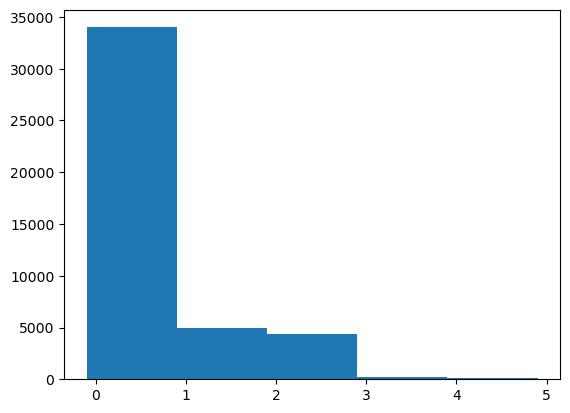

In [54]:
plt.hist(gaia_info['detect_count'], bins = [-0.1,0.9,1.9,2.9,3.9, 4.9])

### Notice that most of the stars in gaia catelog are not detected in our photo. If you go back to the image and check, there are many dim star in the background that we did not picked up. I could potentially apply multiple thresholds to extract stars of different brightness. 

In [55]:
gaia_select = gaia_info[gaia_info['detect_count'] == 2]
len(gaia_select)

4422

## Define the cluster
base on parallex data and proper motion data

(0.0, 40.0)

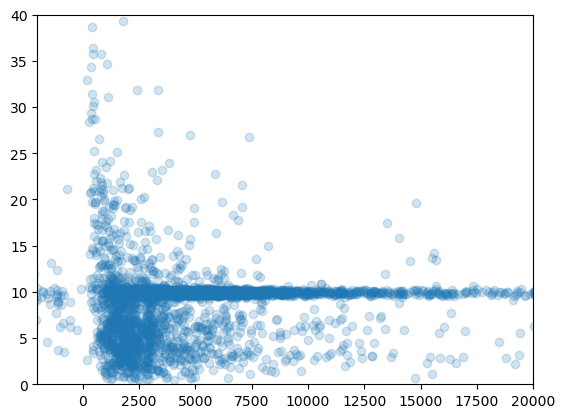

In [141]:
plt.scatter(1000/np.array(gaia_select['parallax']), gaia_select['pm'], alpha=0.2)
plt.xlim(-2000, 20000)
plt.ylim(0, 40)

(9.25, 10.6)

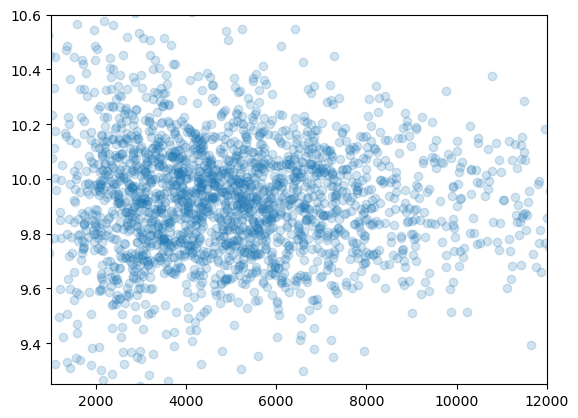

In [142]:
plt.scatter(1000/np.array(gaia_select['parallax']), gaia_select['pm'], alpha=0.2)
plt.xlim(1000, 12000)
plt.ylim(9.25, 10.6)

In [143]:
gaia_cluster = gaia_select[:][1000 < 1000/np.array(gaia_select['parallax'])]
gaia_cluster = gaia_cluster[:][1000/np.array(gaia_cluster['parallax']) < 12000]
gaia_cluster = gaia_cluster[:][gaia_cluster['pm'] > 9.25]
gaia_cluster = gaia_cluster[:][gaia_cluster['pm'] < 10.6]
len(gaia_cluster) # NASA says M55 has over 100,000 stars, I feel like this is true because we did not pick p all the stars.

2140

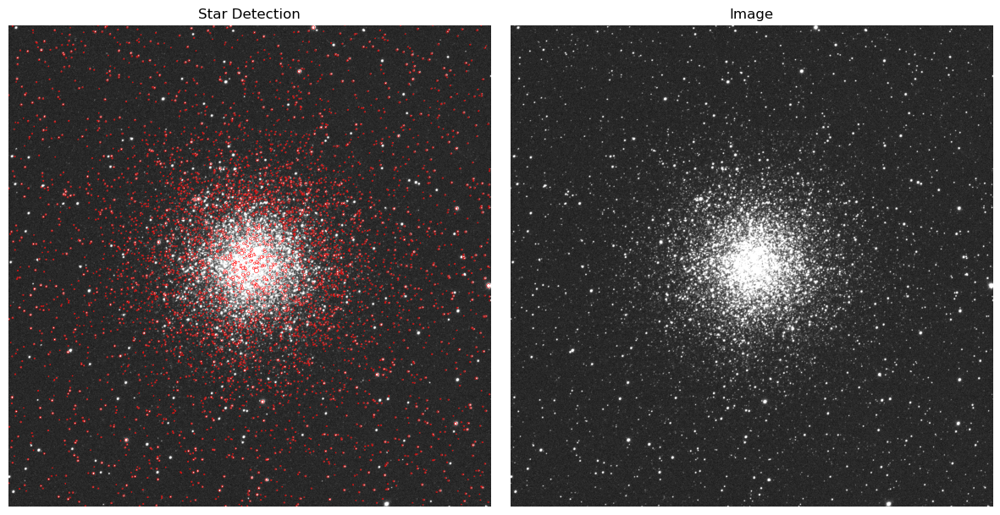

In [115]:
# before apply the parallex and pm condition
visual_detect(B_sci, gaia_select['Bx'], gaia_select['By'], size = gaia_select['Br'])

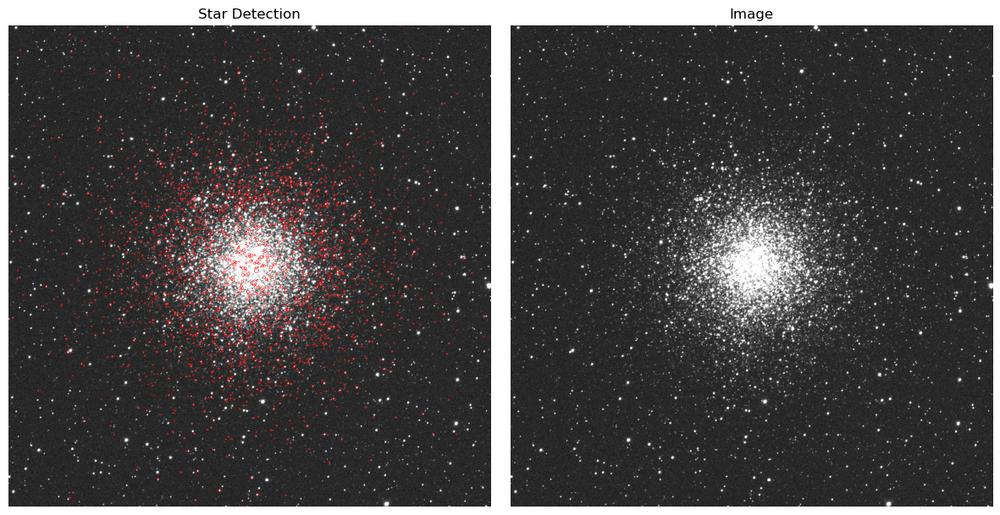

In [116]:
# After apply the parallex and pm condition
visual_detect(B_sci, gaia_cluster['Bx'], gaia_cluster['By'], size = gaia_cluster['Br'])

Notice that a few bright star are in fact not in the cluster since they have distinct parallel or pm characteristics.

In [ ]:
#gaia_cluster[gaia_cluster['DESIGNATION'] == "Gaia DR3 6751395058370322432"] #ref star: Cl* NGC 6809 SAN 13

DESIGNATION,SOURCE_ID,pm,parallax,detect_count,Bx,By,Br,Vx,Vy,Vr
,,mas / yr,mas,,,,,,,
object,int64,float32,float64,int64,int64,int64,int64,int64,int64,int64


## Draw Annulus
Detect local background around a star. For now, for each star center, select one inner surface and one outer surface

In [117]:
# mask
def mask(outer, inner): # radius of inner and outer annulus
    outer = int(outer)
    inner = int(inner)
    frame = np.zeros([2*outer+1, 2*outer+1])
    center = outer
    
    for x in range(2*outer+1):
        for y in range(2*outer+1):
            if (x-outer)**2 + (y-outer)**2 <= (outer+0.5)**2 and (x-outer)**2 + (y-outer)**2 >= (inner+0.5)**2:
                frame[x][y] = 1
    return frame, np.sum(frame), center


In [118]:
# visualize annulus
def visual_annulus(sci_image, x, y, size = 10, x_win = (0,0), y_win = (0,0,), stretch = True, heatmap = False):
    if x_win == (0,0):
        x_win = (0, len(sci_image[0]))
    if y_win == (0,0):
        y_win = (0, len(sci_image))
    if stretch:
        linear_stretched_image = linear_stretch(sci_image[y_win[0]:y_win[1]+1, x_win[0]:x_win[1]+1])
    else:
        linear_stretched_image = np.copy(sci_image[y_win[0]:y_win[1]+1, x_win[0]:x_win[1]+1])

    # Set up the plot to display images side by side
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Display the original SCI image with a circle around the selected star
    if heatmap:
        c0 = axes[0].imshow(linear_stretched_image, cmap='RdBu')
        fig.colorbar(c0, ax=axes[0])
    else:
        axes[0].imshow(linear_stretched_image, cmap='gray')
    axes[0].set_title('Star Detection')
    axes[0].axis('off')

    # Draw a circle around the selected star
    # check if size is a int or a list
    if isinstance(size, int):
        # draw matched stars
        for i in range(len(x)):
            circle = plt.Circle((x[i]-x_win[0], y[i]-y_win[0]), size*2, color='red', fill=False, linewidth=0.4, alpha = 0.8)
            axes[0].add_patch(circle)
            circle = plt.Circle((x[i]-x_win[0], y[i]-y_win[0]), size*2+10, color='red', fill=False, linewidth=0.4, alpha = 0.8)
            axes[0].add_patch(circle)
    else:
        # draw matched stars
        for i in range(len(x)):
            circle = plt.Circle((x[i]-x_win[0], y[i]-y_win[0]), size[i]*2, color='red', fill=False, linewidth=0.4, alpha = 0.8)
            axes[0].add_patch(circle)
            circle = plt.Circle((x[i]-x_win[0], y[i]-y_win[0]), size[i]*2+10, color='red', fill=False, linewidth=0.4, alpha = 0.8)
            axes[0].add_patch(circle)

    # Display the linearly stretched image
    if heatmap:
        c1 = axes[1].imshow(linear_stretched_image, cmap='RdBu')
        fig.colorbar(c1, ax=axes[1])
    else:
        axes[1].imshow(linear_stretched_image, cmap='gray')
    axes[1].set_title('Image')
    axes[1].axis('off')

    # Show the plot
    plt.tight_layout()
    plt.show()

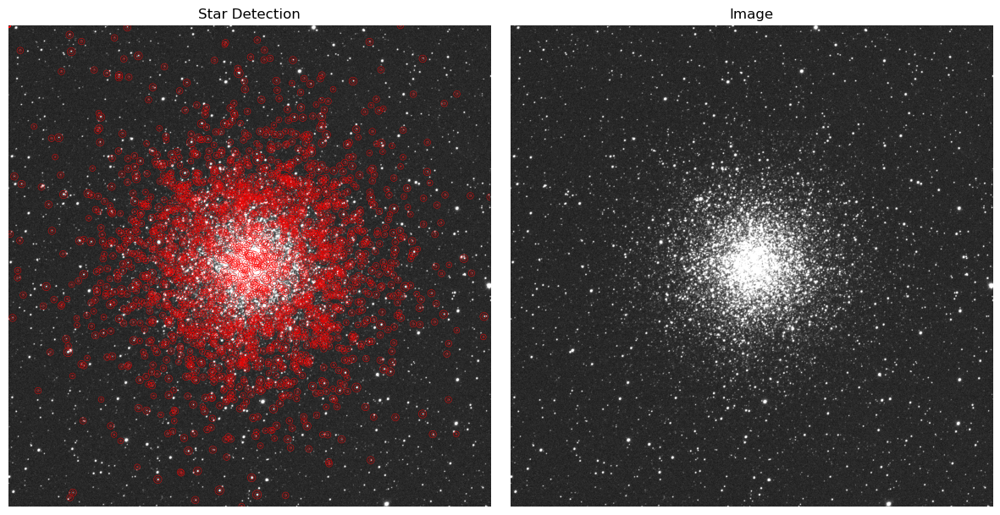

In [119]:
visual_annulus(B_sci, gaia_cluster['Bx'], gaia_cluster['By'], size = gaia_cluster['Br'])

Extract the intensity from the bkg of each filter

In [144]:
gaia_cluster['B_bkg_intensity'] = 0
gaia_cluster['V_bkg_intensity'] = 0
'''gaia_cluster['r_bkg_intensity'] = 0
gaia_cluster['i_bkg_intensity'] = 0'''

"gaia_cluster['r_bkg_intensity'] = 0\ngaia_cluster['i_bkg_intensity'] = 0"

In [145]:
B_sep = B_sci.byteswap().newbyteorder()
B_bkg = sep.Background(B_sep, bw = 80, bh = 80)

V_sep = V_sci.byteswap().newbyteorder()
V_bkg = sep.Background(V_sep, bw = 80, bh = 80)

'''r_sep = r_sci.byteswap().newbyteorder()
r_bkg = sep.Background(r_sep, bw = 80, bh = 80)

i_sep = i_sci.byteswap().newbyteorder()
i_bkg = sep.Background(i_sep, bw = 80, bh = 80)'''

'r_sep = r_sci.byteswap().newbyteorder()\nr_bkg = sep.Background(r_sep, bw = 80, bh = 80)\n\ni_sep = i_sci.byteswap().newbyteorder()\ni_bkg = sep.Background(i_sep, bw = 80, bh = 80)'

In [146]:
image_xlim = len(B_sci[0]) #2400
image_ylim = len(B_sci)

B_bkg_image = B_bkg.back()
V_bkg_image = V_bkg.back()
'''r_bkg_image = r_bkg.back()
i_bkg_image = i_bkg.back()'''

# B
for ind in range(len(gaia_cluster)):
    x, y, r = gaia_cluster['Bx', 'By', 'Br'][ind]
    annulus, pix_count, center = mask(r*2+10, r*2) #adjust the spacing between inner & outer annulus here
    intensity = 0
    pix = 0
    for i in range(len(annulus)): #y
        for j in range(len(annulus[0])): #x
            if annulus[i][j] == 1:
                x_pos = int(x - r + j)
                y_pos = int(y - r + i)
                if  0 <= x_pos < image_xlim and 0 <= y_pos < image_ylim:
                    intensity += B_bkg_image[y_pos][x_pos]                     # alternatively, I could check if the pixel in sci_image is within 3 sigma
                    pix += 1
    gaia_cluster['B_bkg_intensity'][ind] = intensity/pix

# V
for ind in range(len(gaia_cluster)):
    x, y, r = gaia_cluster['Vx', 'Vy', 'Vr'][ind]
    annulus, pix_count, center = mask(r*2+10, r*2) #adjust the spacing between inner & outer annulus here
    intensity = 0
    pix = 0
    for i in range(len(annulus)): #y
        for j in range(len(annulus[0])): #x
            if annulus[i][j] == 1:
                x_pos = int(x - r + j)
                y_pos = int(y - r + i)
                if  0 <= x_pos < image_xlim and 0 <= y_pos < image_ylim:
                    intensity += V_bkg_image[y_pos][x_pos]                     # alternatively, I could check if the pixel in sci_image is within 3 sigma
                    pix += 1
    gaia_cluster['V_bkg_intensity'][ind] = intensity/pix
'''
# r
for ind in range(len(gaia_cluster)):
    x, y, r = gaia_cluster['rx', 'ry', 'rr'][ind]
    annulus, pix_count, center = mask(r*2+10, r*2) #adjust the spacing between inner & outer annulus here
    intensity = 0
    pix = 0
    for i in range(len(annulus)): #y
        for j in range(len(annulus[0])): #x
            if annulus[i][j] == 1:
                x_pos = int(x - r + j)
                y_pos = int(y - r + i)
                if  0 <= x_pos < image_xlim and 0 <= y_pos < image_ylim:
                    intensity += r_bkg_image[y_pos][x_pos]                     # alternatively, I could check if the pixel in sci_image is within 3 sigma
                    pix += 1
    gaia_cluster['r_bkg_intensity'][ind] = intensity/pix

# i
for ind in range(len(gaia_cluster)):
    x, y, r = gaia_cluster['ix', 'iy', 'ir'][ind]
    annulus, pix_count, center = mask(r*2+10, r*2) #adjust the spacing between inner & outer annulus here
    intensity = 0
    pix = 0
    for i in range(len(annulus)): #y
        for j in range(len(annulus[0])): #x
            if annulus[i][j] == 1:
                x_pos = int(x - r + j)
                y_pos = int(y - r + i)
                if  0 <= x_pos < image_xlim and 0 <= y_pos < image_ylim:
                    intensity += i_bkg_image[y_pos][x_pos]                     # alternatively, I could check if the pixel in sci_image is within 3 sigma
                    pix += 1
    gaia_cluster['i_bkg_intensity'][ind] = intensity/pix

'''

"\n# r\nfor ind in range(len(gaia_cluster)):\n    x, y, r = gaia_cluster['rx', 'ry', 'rr'][ind]\n    annulus, pix_count, center = mask(r*2+10, r*2) #adjust the spacing between inner & outer annulus here\n    intensity = 0\n    pix = 0\n    for i in range(len(annulus)): #y\n        for j in range(len(annulus[0])): #x\n            if annulus[i][j] == 1:\n                x_pos = int(x - r + j)\n                y_pos = int(y - r + i)\n                if  0 <= x_pos < image_xlim and 0 <= y_pos < image_ylim:\n                    intensity += r_bkg_image[y_pos][x_pos]                     # alternatively, I could check if the pixel in sci_image is within 3 sigma\n                    pix += 1\n    gaia_cluster['r_bkg_intensity'][ind] = intensity/pix\n\n# i\nfor ind in range(len(gaia_cluster)):\n    x, y, r = gaia_cluster['ix', 'iy', 'ir'][ind]\n    annulus, pix_count, center = mask(r*2+10, r*2) #adjust the spacing between inner & outer annulus here\n    intensity = 0\n    pix = 0\n    for i in 

In [123]:
gaia_cluster[:10]

DESIGNATION,SOURCE_ID,pm,parallax,detect_count,Bx,By,Br,Vx,Vy,Vr,B_bkg_intensity,V_bkg_intensity
,,mas / yr,mas,,,,,,,,,
object,int64,float32,float64,int64,int64,int64,int64,int64,int64,int64,int64,int64
Gaia DR3 6751296957016288000,6751296957016288000,10.070458,0.09140314777304442,2,2397,857,3,2397,857,3,20,45
Gaia DR3 6751311701641358720,6751311701641358720,9.973823,0.15057054955858876,2,2367,1452,5,2367,1451,5,20,45
Gaia DR3 6751312075301486464,6751312075301486464,10.329695,0.14915382459922022,2,2364,1554,2,2364,1553,3,20,45
Gaia DR3 6751299671435822976,6751299671435822976,9.616428,0.21628196568923092,2,2305,1236,3,2305,1236,3,20,46
Gaia DR3 6751296926953764096,6751296926953764096,10.32455,0.17824903477052667,2,2299,850,3,2300,850,3,20,45
Gaia DR3 6751299465277358336,6751299465277358336,9.78312,0.9332155296646616,2,2267,1163,5,2268,1162,5,20,45
Gaia DR3 6751292868207078144,6751292868207078144,10.052091,0.22772420399303764,2,2232,343,3,2233,343,3,20,45
Gaia DR3 6751312040941738240,6751312040941738240,9.804769,0.3428306285857216,2,2231,1521,2,2232,1521,3,20,45


## Calculate intensity in Aperture
calculate the intensity in the aperture

In [124]:
# slightly modify the mask
def aperture_mask(outer): # radius of inner and outer annulus
    outer = int(outer)
    frame = np.zeros([2*outer+1, 2*outer+1])
    center = outer
    
    for x in range(2*outer+1):
        for y in range(2*outer+1):
            if (x-outer)**2 + (y-outer)**2 <= (outer+0.5)**2:
                frame[x][y] = 1
    return frame, np.sum(frame), center

In [147]:
gaia_cluster['B_intensity'] = 0
gaia_cluster['V_intensity'] = 0
'''gaia_cluster['r_intensity'] = 0
gaia_cluster['i_intensity'] = 0'''

"gaia_cluster['r_intensity'] = 0\ngaia_cluster['i_intensity'] = 0"

In [148]:
image_xlim = len(B_sci[0]) #2400
image_ylim = len(B_sci)

# B
for ind in range(len(gaia_cluster)):
    x, y, r, bkg_intensity = gaia_cluster['Bx', 'By', 'Br', 'B_bkg_intensity'][ind]
    aperture, pix_count, center = aperture_mask(r)
    intensity = 0
    for i in range(len(aperture)): #y
        for j in range(len(aperture[0])): #x
            if aperture[i][j] == 1:
                x_pos = int(x - r + j)
                y_pos = int(y - r + i)
                if  0 <= x_pos < image_xlim and 0 <= y_pos < image_ylim:
                    intensity += B_sci[y_pos][x_pos]-bkg_intensity
    gaia_cluster['B_intensity'][ind] = intensity

# V
for ind in range(len(gaia_cluster)):
    x, y, r, bkg_intensity = gaia_cluster['Vx', 'Vy', 'Vr', 'V_bkg_intensity'][ind]
    aperture, pix_count, center = aperture_mask(r)
    intensity = 0
    for i in range(len(aperture)): #y
        for j in range(len(aperture[0])): #x
            if aperture[i][j] == 1:
                x_pos = int(x - r + j)
                y_pos = int(y - r + i)
                if  0 <= x_pos < image_xlim and 0 <= y_pos < image_ylim:
                    intensity += V_sci[y_pos][x_pos]-bkg_intensity
    gaia_cluster['V_intensity'][ind] = intensity

'''# r
for ind in range(len(gaia_cluster)):
    x, y, r, bkg_intensity = gaia_cluster['rx', 'ry', 'rr', 'r_bkg_intensity'][ind]
    aperture, pix_count, center = aperture_mask(r)
    intensity = 0
    for i in range(len(aperture)): #y
        for j in range(len(aperture[0])): #x
            if aperture[i][j] == 1:
                x_pos = int(x - r + j)
                y_pos = int(y - r + i)
                if  0 <= x_pos < image_xlim and 0 <= y_pos < image_ylim:
                    intensity += r_sci[y_pos][x_pos]-bkg_intensity
    gaia_cluster['r_intensity'][ind] = intensity

# i
for ind in range(len(gaia_cluster)):
    x, y, r, bkg_intensity = gaia_cluster['ix', 'iy', 'ir', 'i_bkg_intensity'][ind]
    aperture, pix_count, center = aperture_mask(r)
    intensity = 0
    for i in range(len(aperture)): #y
        for j in range(len(aperture[0])): #x
            if aperture[i][j] == 1:
                x_pos = int(x - r + j)
                y_pos = int(y - r + i)
                if  0 <= x_pos < image_xlim and 0 <= y_pos < image_ylim:
                    intensity += i_sci[y_pos][x_pos]-bkg_intensity
    gaia_cluster['i_intensity'][ind] = intensity
    '''

"# r\nfor ind in range(len(gaia_cluster)):\n    x, y, r, bkg_intensity = gaia_cluster['rx', 'ry', 'rr', 'r_bkg_intensity'][ind]\n    aperture, pix_count, center = aperture_mask(r)\n    intensity = 0\n    for i in range(len(aperture)): #y\n        for j in range(len(aperture[0])): #x\n            if aperture[i][j] == 1:\n                x_pos = int(x - r + j)\n                y_pos = int(y - r + i)\n                if  0 <= x_pos < image_xlim and 0 <= y_pos < image_ylim:\n                    intensity += r_sci[y_pos][x_pos]-bkg_intensity\n    gaia_cluster['r_intensity'][ind] = intensity\n\n# i\nfor ind in range(len(gaia_cluster)):\n    x, y, r, bkg_intensity = gaia_cluster['ix', 'iy', 'ir', 'i_bkg_intensity'][ind]\n    aperture, pix_count, center = aperture_mask(r)\n    intensity = 0\n    for i in range(len(aperture)): #y\n        for j in range(len(aperture[0])): #x\n            if aperture[i][j] == 1:\n                x_pos = int(x - r + j)\n                y_pos = int(y - r + i)\n   

In [149]:
gaia_cluster = gaia_cluster[gaia_cluster['Vr'] != 0]
gaia_cluster = gaia_cluster[gaia_cluster['Br'] != 0]

In [150]:
a = gaia_cluster[20000 < gaia_cluster['B_intensity']]
a = a[a["B_intensity"]<30000]
a[:10]

DESIGNATION,SOURCE_ID,pm,parallax,detect_count,Bx,By,Br,Vx,Vy,Vr,B_bkg_intensity,V_bkg_intensity,B_intensity,V_intensity
,,mas / yr,mas,,,,,,,,,,,
object,int64,float32,float64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64
Gaia DR3 6751299190399514752,6751299190399514752,9.845781,0.11217480235071393,2,1975,1304,6,1976,1304,6,20,45,20919,27243
Gaia DR3 6751295445185656448,6751295445185656448,9.936363,0.1525545139034275,2,1918,915,6,1919,915,6,20,45,20207,25315
Gaia DR3 6751296033600644992,6751296033600644992,10.097553,0.12141202978539782,2,1699,1194,6,1700,1193,6,22,48,22539,29619
Gaia DR3 6751393443462634240,6751393443462634240,9.778787,0.17586561395028494,2,1595,1513,6,1595,1512,6,21,47,20008,25306
Gaia DR3 6751389526452369408,6751389526452369408,9.648891,0.1532555459257176,2,1570,1074,6,1571,1073,6,23,51,20176,25077
Gaia DR3 6751247070973438976,6751247070973438976,9.746964,0.19095627576277957,2,1555,510,6,1555,510,6,20,45,20757,27168
Gaia DR3 6751294659211088512,6751294659211088512,9.914626,0.13683497331940708,2,1482,872,6,1483,872,6,23,50,21165,27076
Gaia DR3 6751388903678497408,6751388903678497408,9.991059,0.13615809746804935,2,1400,1163,6,1400,1163,5,39,80,22292,27092


## Intensity to Flux, then to Magnitude

We assume the relationship between the *intensity* of a star we measure in A/D units as $f(\lambda)$ and the actual *flux* of the star $F(\lambda)$ in $\frac{photon}{{cm}^2s\mu}$ is linear
$$
f(\lambda) = C(\lambda) F(\lambda) 
$$
where C is a constant depends on the telescope, CCD, and *wavelength*. However, since the wavelength for each photo in a specific filter is the same, we only need to calibrate this once for every filter. 

The difference in magnitude in two stars is then given by 
$$
m_1 - m_2 = - 2.5 \log_{10}(\frac{F_1(\lambda)}{F_2(\lambda)})
$$
$$
m_1 - m_2 = - 2.5 \log_{10}(\frac{f_1(\lambda)/C(\lambda)}{f_2(\lambda)/C(\lambda)}) = - 2.5 \log_{10}(\frac{f_1(\lambda)}{f_2(\lambda)})
$$
Hence, if we are considering relative magnitude between two stars, then we may use intensity as flux.
$$
m_1 =  m_0 - 2.5 \log_{10}(\frac{f_1(\lambda)}{f_0(\lambda)})
$$

To get information on the magnitude in different filter for reference star, go to the SIMBAD database
- NGC 2682 (M67): https://simbad.u-strasbg.fr/simbad/sim-id?Ident=%401136125&Name=NGC++2682&submit=display+all+measurements#lab_meas
- Query object nearby: https://simbad.u-strasbg.fr/simbad/sim-coo?Coord=08+51+23.0%2B11+48+50&CooFrame=ICRS&CooEqui=2000.0&CooEpoch=J2000&Radius.unit=arcmin&submit=Query+around&Radius=2
- Object type: https://simbad.cds.unistra.fr/guide/otypes.htx

I found dozens of reference star candidate
1. chatgpt says A F G K stars are good and M O stars are bad. I only have F and G, I am going with F stars
2. I have the manitude default in Johnson Bassel filter, which is what we use for B, V. But I don't know how to find/switch to SDSS filter for r' and i'

- Cl* NGC 2682 ES IV-1
- NGC 2682 155 (almost touch another star, may be a bad reference)
- NGC 2682 149b
- NGC 2682 126
- Cl* NGC 2682 ES IV-17
- NGC 2682 164 (red giant)
- Proceed with one of above, then go back later to find the best option

### this is no longer in use
Proceed with Cl* NGC 2682 ES IV-17 (Gaia DR3 604921134048349824)
- B   14.97	(SIMBAD)
- V   14.366 (SIMBAD)
- r'	14.141 (SDSS)
- i'	13.982 (SDSS)

### use this
Gaia DR3 6751388869318791936
- B 14.649
- V 13.738

In [151]:
# find the intensity of the reference star
ref_star = gaia_cluster[gaia_cluster['DESIGNATION'] == 'Gaia DR3 6751388869318791936']

#extract intensity of ref star
B_f_0 = ref_star['B_intensity'][0]
V_f_0 = ref_star['V_intensity'][0]
#r_f_0 = ref_star['r_intensity'][0]
#i_f_0 = ref_star['i_intensity'][0]

# set magnitude of the reference star
B_m_0 = 14.649
V_m_0 = 13.738
#r_m_0 = 15.05
#i_m_0 = 14.75

In [152]:
ref_star

DESIGNATION,SOURCE_ID,pm,parallax,detect_count,Bx,By,Br,Vx,Vy,Vr,B_bkg_intensity,V_bkg_intensity,B_intensity,V_intensity
,,mas / yr,mas,,,,,,,,,,,
object,int64,float32,float64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64
Gaia DR3 6751388869318791936,6751388869318791936,10.000931,0.19249250061883927,2,1318,1190,5,1318,1190,6,57,109,23586,60657


In [153]:
B_magnitude = np.zeros(len(gaia_cluster))
for i in range(len(gaia_cluster)):
    B_magnitude[i] = B_m_0 - 2.5 * np.log10(gaia_cluster['B_intensity'][i] / B_f_0)

V_magnitude = np.zeros(len(gaia_cluster))
for i in range(len(gaia_cluster)):
    V_magnitude[i] = V_m_0 - 2.5 * np.log10(gaia_cluster['V_intensity'][i] / V_f_0)
'''
r_magnitude = np.zeros(len(gaia_cluster))
for i in range(len(gaia_cluster)):
    r_magnitude[i] = r_m_0 - 2.5 * np.log10(gaia_cluster['r_intensity'][i] / r_f_0)

i_magnitude = np.zeros(len(gaia_cluster))
for i in range(len(gaia_cluster)):
    i_magnitude[i] = i_m_0 - 2.5 * np.log10(gaia_cluster['i_intensity'][i] / i_f_0)
'''
gaia_cluster['B_magnitude'] = B_magnitude
gaia_cluster['V_magnitude'] = V_magnitude
'''
gaia_cluster['r_magnitude'] = r_magnitude
gaia_cluster['i_magnitude'] = i_magnitude'''

"\ngaia_cluster['r_magnitude'] = r_magnitude\ngaia_cluster['i_magnitude'] = i_magnitude"

In [154]:
gaia_cluster[0:5]

DESIGNATION,SOURCE_ID,pm,parallax,detect_count,Bx,By,Br,Vx,Vy,Vr,B_bkg_intensity,V_bkg_intensity,B_intensity,V_intensity,B_magnitude,V_magnitude
,,mas / yr,mas,,,,,,,,,,,,,
object,int64,float32,float64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,float64,float64
Gaia DR3 6751296957016288000,6751296957016288000,10.070458,0.09140314777304442,2,2397,857,3,2397,857,3,20,45,518,961,18.79481133614625,18.238393848284847
Gaia DR3 6751311701641358720,6751311701641358720,9.973823,0.15057054955858876,2,2367,1452,5,2367,1451,5,20,45,3722,7916,16.65369481352246,15.948937853620313
Gaia DR3 6751312075301486464,6751312075301486464,10.329695,0.14915382459922022,2,2364,1554,2,2364,1553,3,20,45,274,725,19.48625932845836,18.544357301028725
Gaia DR3 6751299671435822976,6751299671435822976,9.616428,0.21628196568923092,2,2305,1236,3,2305,1236,3,20,46,623,954,18.594415618861408,18.24633138069597
Gaia DR3 6751296926953764096,6751296926953764096,10.32455,0.17824903477052667,2,2299,850,3,2300,850,3,20,45,396,784,19.08639777069555,18.459412160745114


## Calculate Luminosity

The formula for luminosity is 

$$
L = L_\odot {10}^{\frac{M_\odot - M_V}{2.5}}
$$

where M is the absolute magnitude in visible band

The Absolute Magnitude of Sun is $M_\odot = 4.83$

The absolute magnitude is then calculate through
$$
M_V = m_V - 5\log_{10}(d/d_0) = m_V - 5\log_{10}(d) + 5
$$

- $m_V$ is the apparent magnitude in the V band.
- d is the distance to the star in parsecs.
- $d_0 = 10 parsec$

$$d(pc) = \frac{1}{{parallex} {(arcsecond)}} = \frac{1000}{{parallex} {(milliarcsecond = mas)}} $$

In [155]:
gaia_cluster['distance'] = 1000/gaia_cluster['parallax']
gaia_cluster['distance'].unit = u.parsec

In [156]:
gaia_cluster['abs_M_V'] = gaia_cluster['V_magnitude'] - 5*np.log10(gaia_cluster['distance']) + 5

In [157]:
gaia_cluster['Luminosity'] =  np.power(10, (4.83-gaia_cluster['abs_M_V'])/2.5)

Text(0, 0.5, 'Luminosity (Solar Unit)')

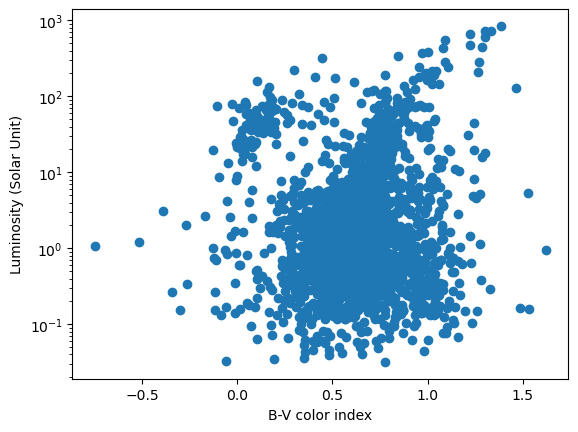

In [158]:
plt.scatter(gaia_cluster['B_magnitude'] - gaia_cluster['V_magnitude'], gaia_cluster['Luminosity'])
plt.yscale('log')
plt.xlabel('B-V color index')
plt.ylabel('Luminosity (Solar Unit)')

In [160]:
gaia_cluster = gaia_cluster[:][1000 < 1000/np.array(gaia_cluster['parallax'])]
gaia_cluster = gaia_cluster[:][1000/np.array(gaia_cluster['parallax']) < 12000]
gaia_cluster = gaia_cluster[:][gaia_cluster['pm'] > 9.25]
gaia_cluster = gaia_cluster[:][gaia_cluster['pm'] < 10.6]
len(gaia_cluster) # NASA says M55 has over 100,000 stars, I feel like this is true because we did not pick p all the stars.

2075

Text(0, 0.5, 'Luminosity (Solar Unit)')

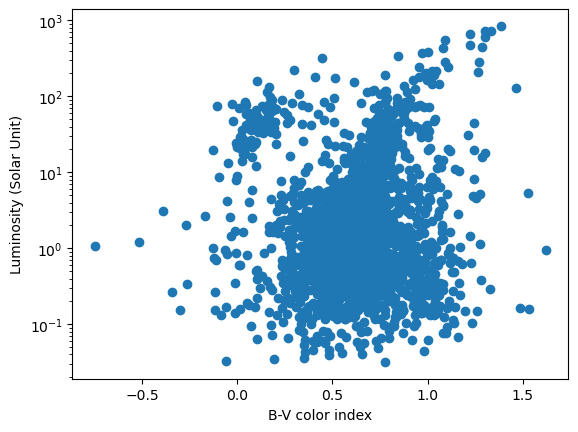

In [161]:
plt.scatter(gaia_cluster['B_magnitude'] - gaia_cluster['V_magnitude'], gaia_cluster['Luminosity'])
plt.yscale('log')
plt.xlabel('B-V color index')
plt.ylabel('Luminosity (Solar Unit)')